## 1. Execute one of the following cell to pick AGs results to be plotted

### Specify 
- datasets that should be loaded, and the label you want to assign to them (eg GAN, GAN_versionXX ...)
- output directory name (will be created if needed)
- SNP position file(s)  
- number of individuals to keep from each dataset (will be randomly subampled if less than the total number)

In [1]:
outDir = "../../outputs/data_analysis/"
# number of individuals to keep (for each dataset)
# can be set to a small number to run some tests
# nsub = 5000 for the full dataset
nsub = 100 
infileDir = "../../"
# The key name can be changed appart from the Real one, that is mandatory
infiles = {'Real': infileDir + "1000G_real_genomes/805_SNP_1000G_real.hapt",
           'tf_gan': infileDir + "outputs/tf_gan_output/9500_output.hapt",
           'wgan-gp': infileDir + "outputs/wgan-gp_run2/9001_output.hapt",
           'wgan': infileDir + "outputs/wgan_run2/6001_output.hapt",
           'pytorch_gan': infileDir + "outputs/pytorch_gan_output/9501_output.hapt"
#            'GAN': infileDir + "outputs/805_SNP_GAN_AG_20000epochs.hapt.zip",
#            'RBM': infileDir + "RBM_AGs/805_SNP_RBM_AG_800Epochs.hapt.zip",
          }
realposfname = infileDir + "1000G_real_genomes/805_SNP.legend" 
# same SNP positions for all datasets so it is just repeated for all keys:
position_fname = {key:realposfname for key in infiles.keys()} 

## 2. Imports and general color dictionary

In [2]:
import seaborn as sns
import pandas as pd
import numpy as np
import importlib
import os
from short import plot_utils as plu
dirscript = 'short'

Datasets under study:
 {'Real': '../../1000G_real_genomes/805_SNP_1000G_real.hapt', 'tf_gan': '../../outputs/tf_gan_output/9500_output.hapt', 'wgan-gp': '../../outputs/wgan-gp_run2/9001_output.hapt', 'wgan': '../../outputs/wgan_run2/6001_output.hapt', 'pytorch_gan': '../../outputs/pytorch_gan_output/9501_output.hapt'}
Output Directory for figures: ../../outputs/data_analysis/
 Real dataset positions: ../../1000G_real_genomes/805_SNP.legend
 Sample size:100


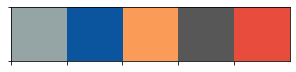

In [3]:
inDir = ""
mainOutDir = outDir
# General colors
# if you add a new key in infiles, you should add a corresponding color in the following dictionnary
# leaving examples for extra labels below on purpose 
allcolpal = dict({'Real':"#95a5a6", 
                  'Binomial':"#2ecc71", 'Markov_w5':'#6a3d9a', 'Markov_w10':"#9b59b6", 
                  'GAN':"#3498db", 'GAN_ep20k':"#3498db", # blue main GANs (you can choose the same color for multiple labels if you wish)
                  'tf_gan':'#0b559f', # dark blue SM GAN 805
                  'pytorch_gan':"#e74c3c", 'RBM_bis': "#e74c3c", # red MAIN RBMs
                  'wgan-gp': '#fa9b58', 'RBM_SIG2': '#fece7f', # orange SM RBMs chunk
                  'wgan':'#575757', 'Test2':'#393939',
                  'HAPGEN': '#458B74',
                  'stdpopsim': '#fa9b58',
                  'RBM_init_random':'salmon', #sns.color_palette('Reds_r',14)[0], 
                  'RBM_init_test': 'sienna', #sns.color_palette('Reds_r',14)[1],
                  'RBM_init_train': 'darkorange' #sns.color_palette('Reds_r',14)[2], 
              })
## Print the full color palette if needed:
# print(allcolpal.keys())
# sns.palplot(sns.color_palette(allcolpal.values()))

# Colors for RBMs at different epochs
RBM_labels = ['RBM_ep{}'.format(ep) for ep in np.concatenate( [np.linspace(200,650,10).astype(int), [690]])]
allcolpal.update(dict(zip(RBM_labels, sns.color_palette('Reds_r',len(RBM_labels)+3))))

#print(allcolpal.keys())
#sns.palplot(sns.color_palette(allcolpal.values()))

# Update current color palette to the dataset type in infiles 
colpal =  {key:allcolpal[key] for key in infiles.keys()}
sns.set_palette(colpal.values())

print("Datasets under study:\n",infiles)
sns.palplot(sns.color_palette())
print(f"Output Directory for figures: {outDir}\n",
      f"Real dataset positions: {realposfname}\n",
      f"Sample size:{nsub}")


## 3. run notebook to plot all figures or a subset of sumstats (for faster results)

In [4]:
f"Figures will be saved in {mainOutDir} or its subdirectories"

'Figures will be saved in ../../outputs/data_analysis/ or its subdirectories'

In [5]:
## Print one more time the name of datasets that will be loaded
## the path should exist otherwise you need to check that your setup is correct
[f"Input file {f} exists: {os.path.exists(f)}" for f in infiles.values()]

['Input file ../../1000G_real_genomes/805_SNP_1000G_real.hapt exists: True',
 'Input file ../../outputs/tf_gan_output/9500_output.hapt exists: True',
 'Input file ../../outputs/wgan-gp_run2/9001_output.hapt exists: True',
 'Input file ../../outputs/wgan_run2/6001_output.hapt exists: True',
 'Input file ../../outputs/pytorch_gan_output/9501_output.hapt exists: True']

In [6]:
# Setup options (transformations, sumstats to compute etc) and output directory (automatically derived from maintOutDir)

importlib.reload(plu) # useful only if plot_utils is changed since you imported it for dev reason
boolComputeAATS = True # if False notebook 5 will reload previously computed AATS instead of computing it
figwi = 12 # control size of some figures 

# set allchecks to False for a first rapid scan
# set to True for computing/plotting all sumstats and scores (long, better on a cluster)
allchecks = True #False 

# pick the transformations you want to apply to the datasets
# For no transformation choose 
# transformations=None
transformations={'to_minor_encoding':False, 'min_af': 0, 'max_af': 1}

if not transformations is None:
    tname=''.join([f'{k}_{v}' for k,v in transformations.items()]) # changed from ";" and {k}-{v}
    outDir = os.path.join(mainOutDir,tname+'/')
print(f"Figures will be saved in {outDir}")
if os.path.exists(outDir):
    print('This directory exists, the following files might be overwritten:')
    print(os.listdir(outDir))

Figures will be saved in ../../outputs/data_analysis/to_minor_encoding_Falsemin_af_0max_af_1/


### Compute summary statistics
**You can pick which notebooks to execute** (and comment the other lines)  
Only the **first one is mandatory**  (plotfig_utils_1_INIT.ipynb)  
It loads datasets, applies basic transformations if asked, and initializes a few variables (such as a dictionnary of haplotypes, allele counts, fixed site vectors, etc)

3.7.4 (default, Aug 13 2019, 15:17:50) 
[Clang 4.0.1 (tags/RELEASE_401/final)]
* Loading data (short script sumstats)...
../../outputs/data_analysis/to_minor_encoding_Falsemin_af_0max_af_1/ does not exists. Creating ../../outputs/data_analysis/to_minor_encoding_Falsemin_af_0max_af_1/
{'Real': '#95a5a6', 'tf_gan': '#0b559f', 'wgan-gp': '#fa9b58', 'wgan': '#575757', 'pytorch_gan': '#e74c3c'}
dict_keys(['Real', 'tf_gan', 'wgan-gp', 'wgan', 'pytorch_gan'])


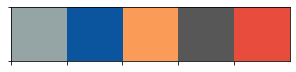

Real loaded from ../../1000G_real_genomes/805_SNP_1000G_real.hapt
(5008, 807)
(100, 807)
False 0 1
Real (100, 805)
tf_gan loaded from ../../outputs/tf_gan_output/9500_output.hapt
(216, 807)
(100, 807)
False 0 1
tf_gan (100, 805)
wgan-gp loaded from ../../outputs/wgan-gp_run2/9001_output.hapt
(216, 807)
(100, 807)
False 0 1
wgan-gp (100, 805)
wgan loaded from ../../outputs/wgan_run2/6001_output.hapt
(216, 807)
(100, 807)
False 0 1
wgan (100, 805)
pytorch_gan loaded from ../../outputs/pytorch_gan_output/9501_output.hapt
(216, 807)
(100, 807)
False 0 1
pytorch_gan (100, 805)
Dictionnary of datasets: 5
Real 100
10 fixed sites in Real
tf_gan 100
7 fixed sites in tf_gan
wgan-gp 100
6 fixed sites in wgan-gp
wgan 100
4 fixed sites in wgan
pytorch_gan 100
27 fixed sites in pytorch_gan
32 sites fixed in at least one dataset
0 fixed SNPs in Real that are not fixed in Real
0 fixed SNPs in tf_gan that are not fixed in Real
1 fixed SNPs in wgan-gp that are not fixed in Real
0 fixed SNPs in wgan that

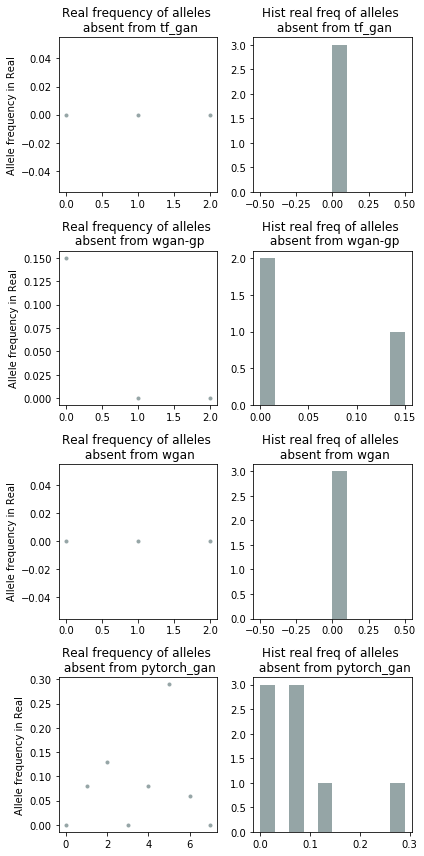

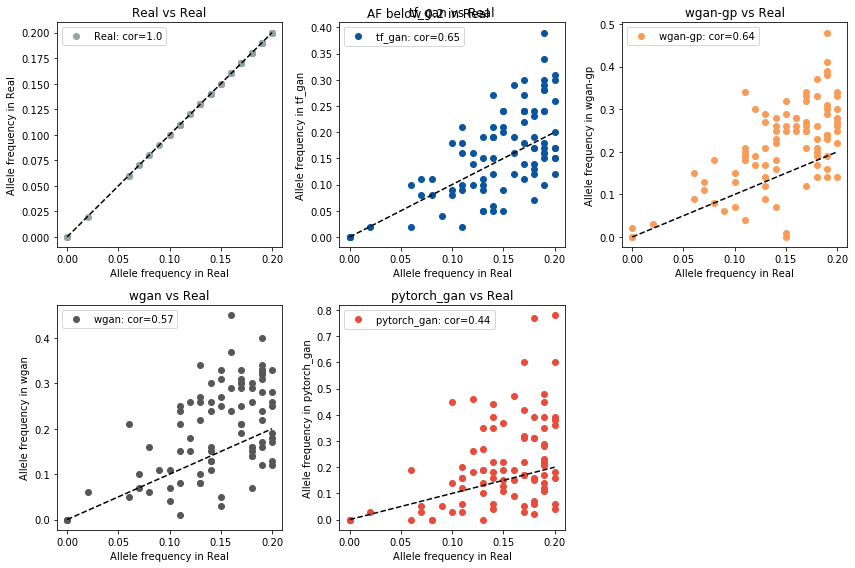

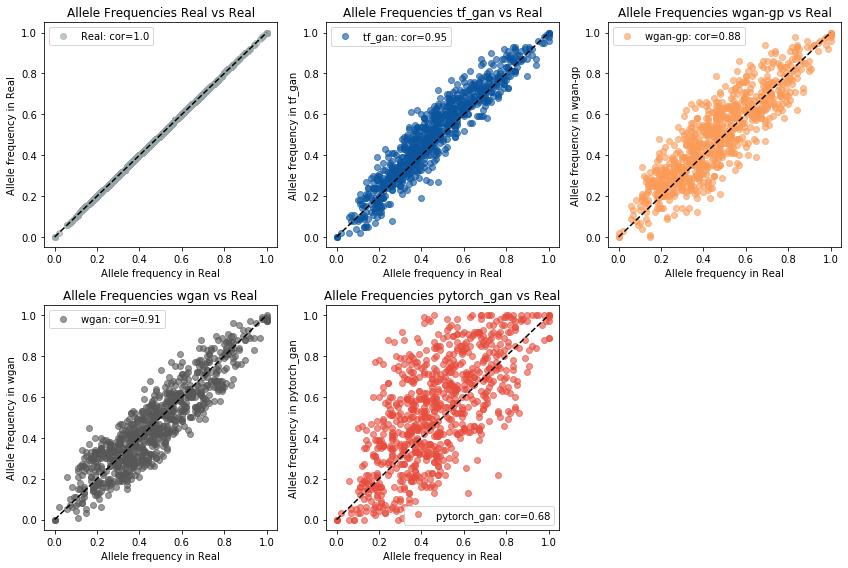

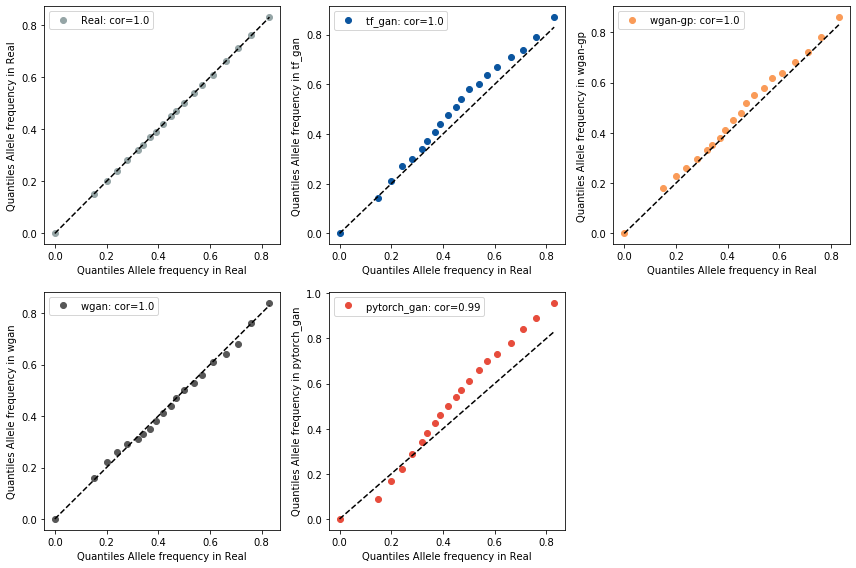

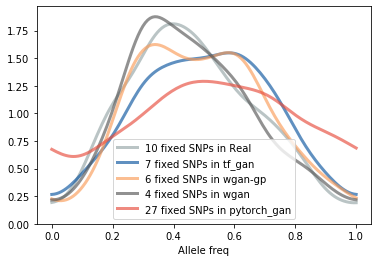

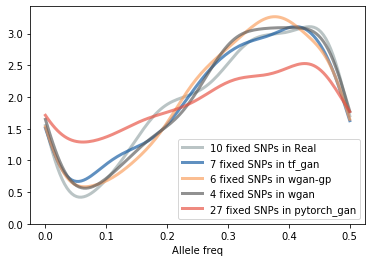

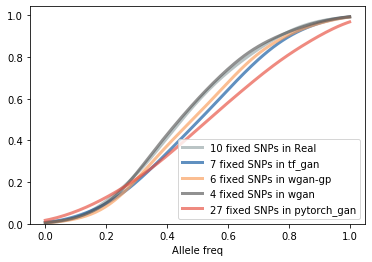

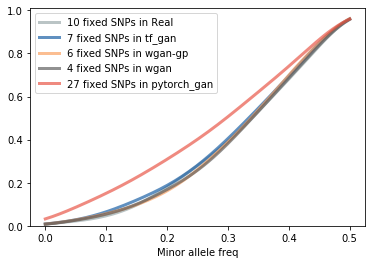

*************************************************************
*** Computation and plotting Allele Frequencies DONE. Figures saved in ../../outputs/data_analysis/to_minor_encoding_Falsemin_af_0max_af_1/ ***
*************************************************************
* Computing and plotting PCA...
Computing Combined PCA ...


/Users/nickmatthew/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:400: UserWarning: The following kwargs were not used by contour: 'color'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


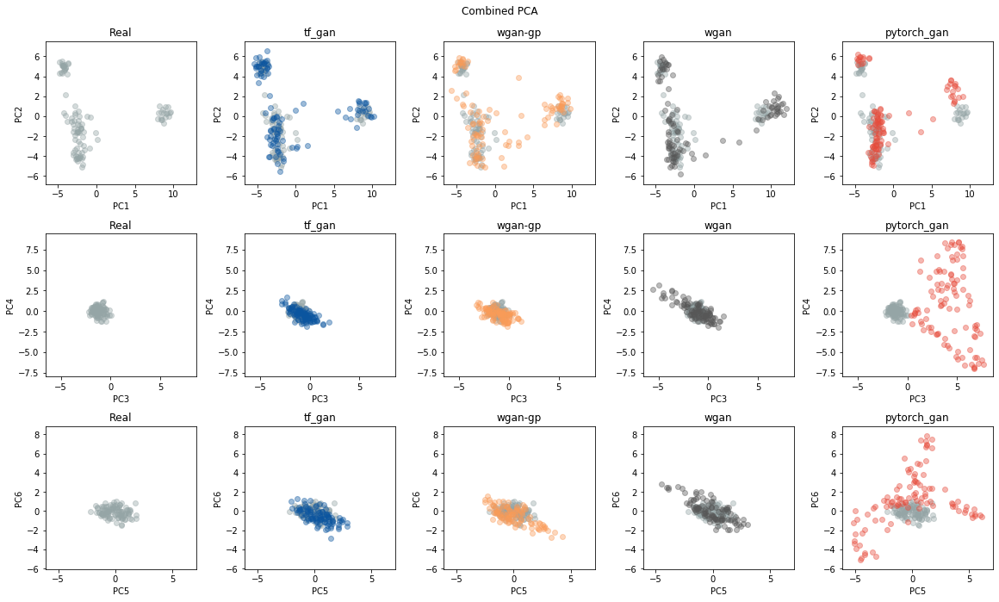

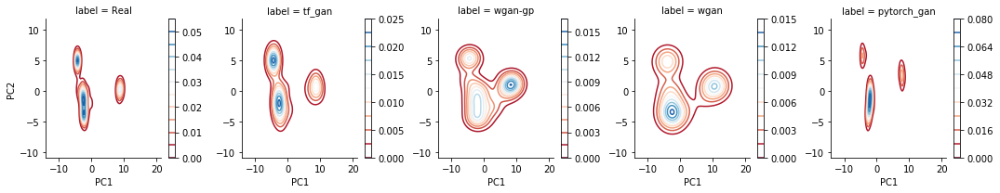

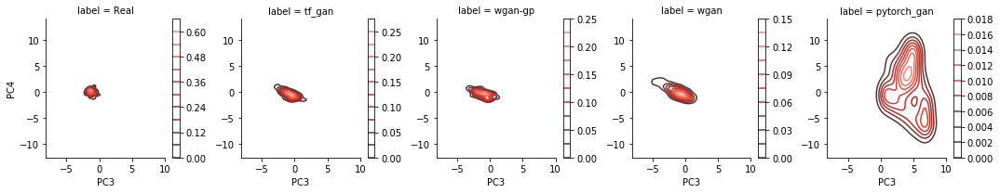

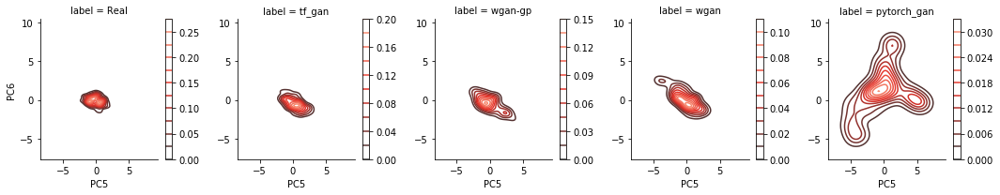

Computing Coupled PCA ...


/Users/nickmatthew/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:400: UserWarning: The following kwargs were not used by contour: 'color'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


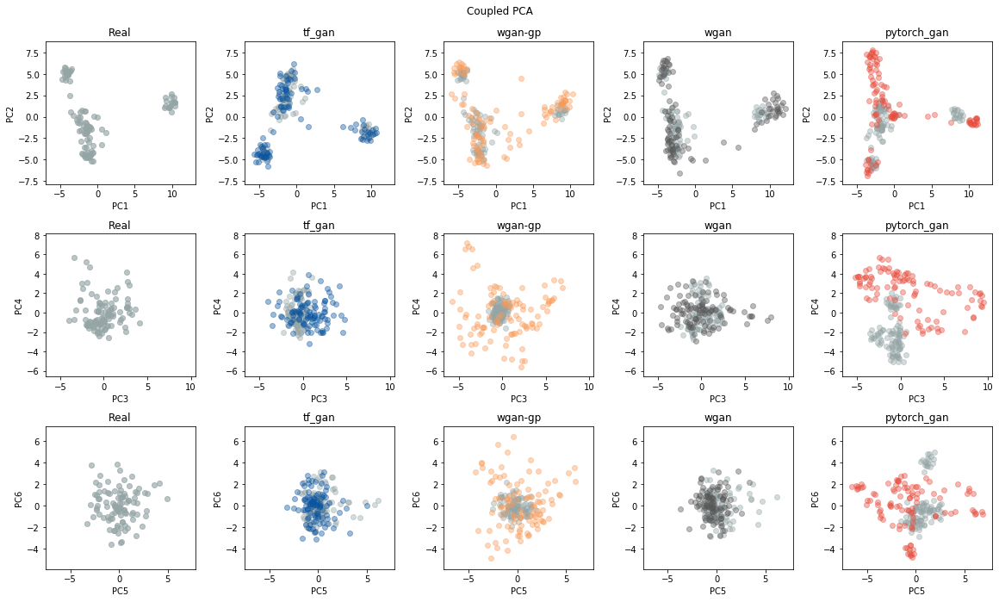

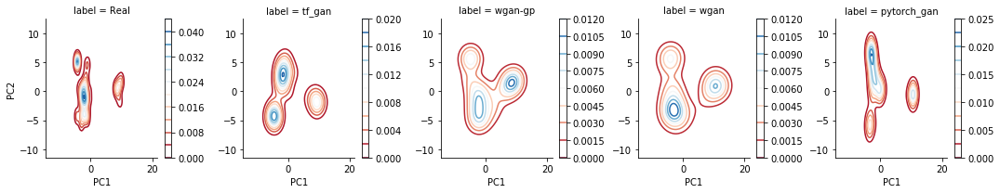

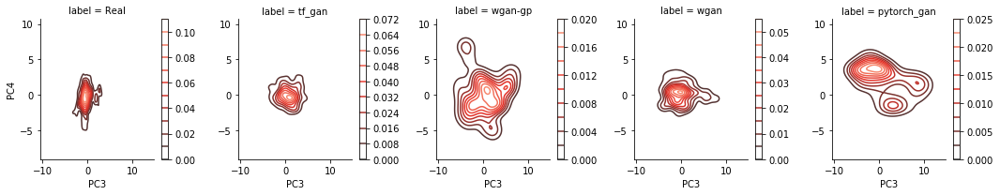

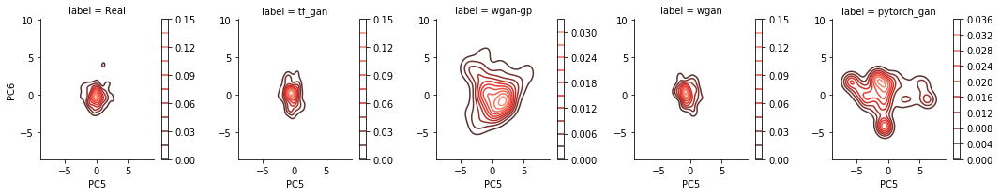

wasserstein
wasserstein2D
Computing Independent PCA ...


/Users/nickmatthew/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:400: UserWarning: The following kwargs were not used by contour: 'color'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


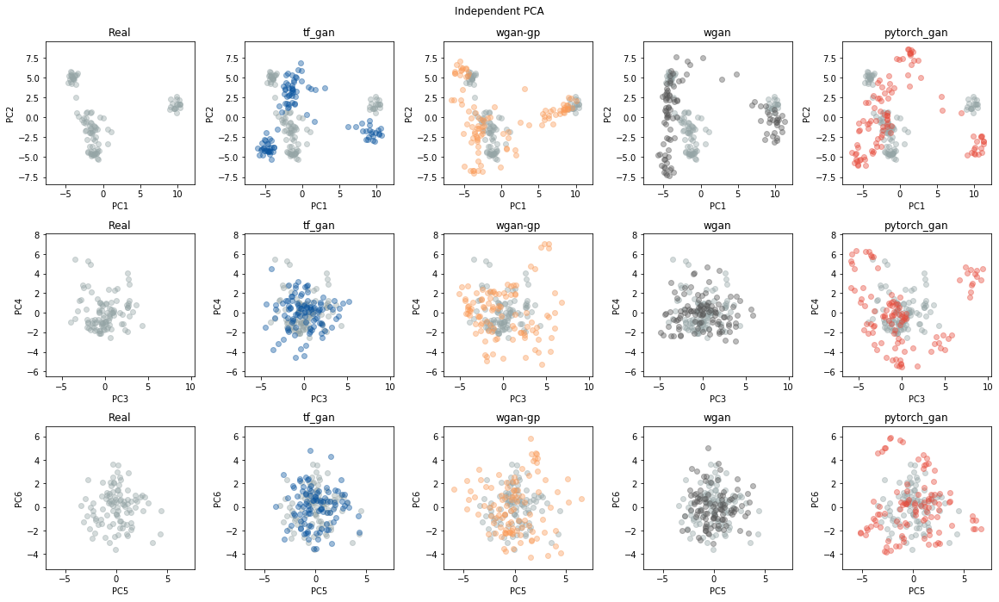

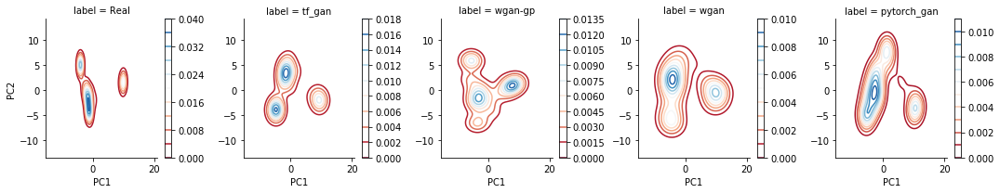

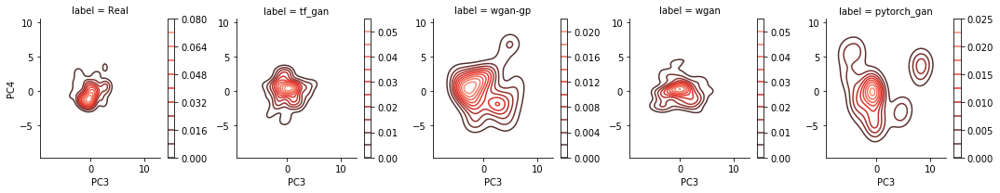

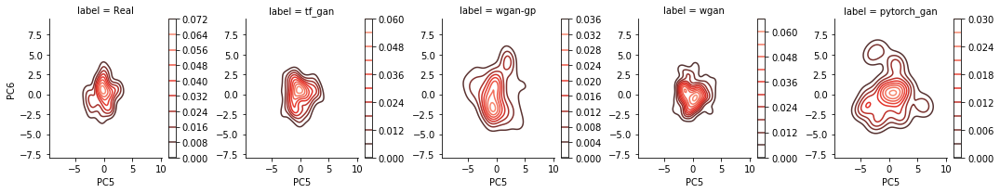

method       stat         label      
coupled_PCA  wasserstein  Real           0.000000
                          pytorch_gan    1.811100
                          tf_gan         0.780871
                          wgan           1.301305
                          wgan-gp        1.151371
Name: statistic, dtype: float64
*****************************************************************
*** Computation and plotting PCA DONE. Figures saved in ../../outputs/data_analysis/to_minor_encoding_Falsemin_af_0max_af_1/ ***
*****************************************************************
* Computing and plotting LD...
Real
tf_gan
wgan-gp
wgan
pytorch_gan


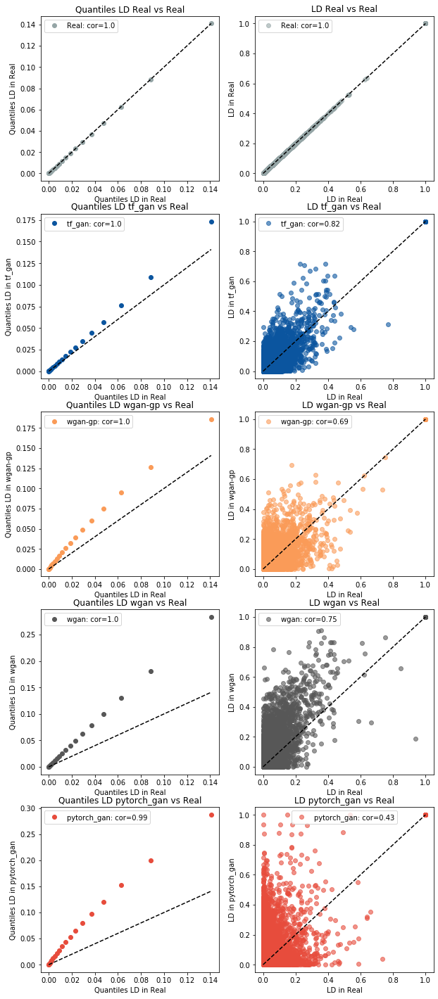

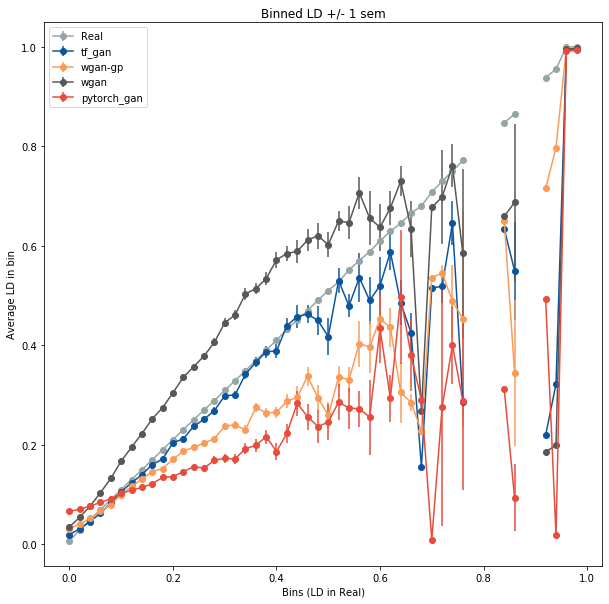

* Plotting LD block matrices...


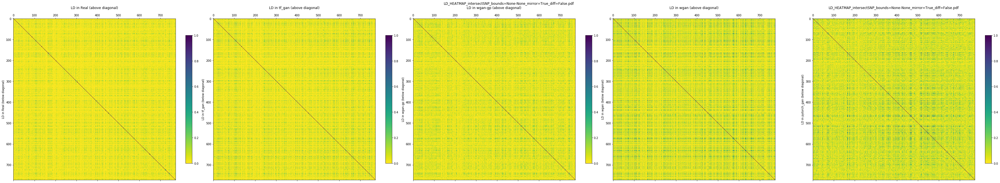

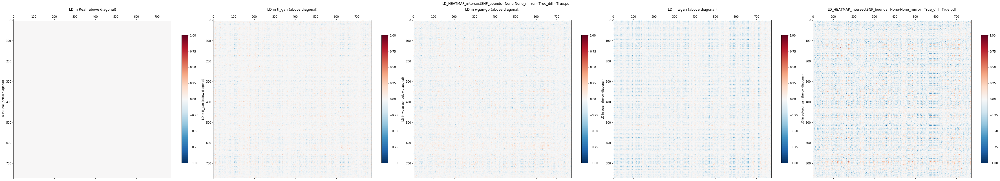

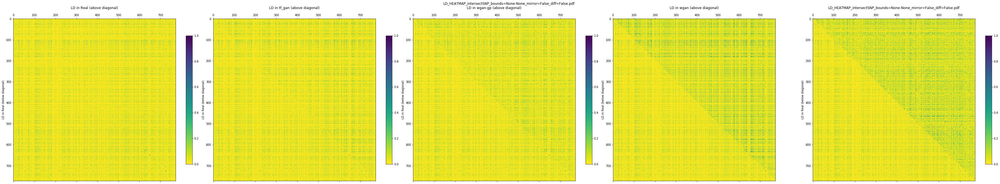

****************************************************************
*** Computation and plotting LD DONE. Figures saved in ../../outputs/data_analysis/to_minor_encoding_Falsemin_af_0max_af_1/ ***
****************************************************************


In [7]:
%run -p {dirscript}/plotfig_utils_1_INIT.ipynb  # mandatory, all lines below are optional
%run -p {dirscript}/plotfig_utils_2_AF.ipynb 
%run -p {dirscript}/plotfig_utils_3_PCA.ipynb
%run -p {dirscript}/plotfig_utils_4_LD.ipynb
# if allchecks:
#     %run -p {dirscript}/plotfig_utils_5_DIST_AATS.ipynb # computationnally long
# if allchecks:
#     %run -p {dirscript}/plotfig_utils_6_3pointcorr.ipynb  # computationnally long